In [1]:
%pip install nibabel


[notice] A new release of pip is available: 23.1.1 -> 23.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [50]:
#Files
import json
import nibabel as nib

# ML / AI / Vision
import pandas as pd
import numpy as np
import torch
import torchvision


# Visual
import matplotlib.pyplot as plt

# General
import os
from typing import List, Dict
from tqdm import tqdm
from dataclasses import dataclass, asdict
from concurrent.futures import ThreadPoolExecutor, as_completed

from utils import *
torchvision.__version__, torch.__version__

('0.15.2+cu117', '2.0.1+cu117')

In [2]:
torch.cuda.is_available()

True

In [ ]:
# Download all the data locally, this will take a while, it's 27GB
# !wget https://msd-for-monai.s3-us-west-2.amazonaws.com/Task03_Liver.tar
# !tar -xvf Task03_Liver.tar

--2023-06-03 11:27:43--  https://msd-for-monai.s3-us-west-2.amazonaws.com/Task03_Liver.tar
Resolving msd-for-monai.s3-us-west-2.amazonaws.com (msd-for-monai.s3-us-west-2.amazonaws.com)... 52.218.229.145, 52.218.224.241, 3.5.77.162, ...
Connecting to msd-for-monai.s3-us-west-2.amazonaws.com (msd-for-monai.s3-us-west-2.amazonaws.com)|52.218.229.145|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 28925891584 (27G) [application/x-tar]
Saving to: ‘Task03_Liver.tar’

Task03_Liver.tar    100%[===================>]  26.94G  17.1MB/s    in 27m 52s 

2023-06-03 11:55:36 (16.5 MB/s) - ‘Task03_Liver.tar’ saved [28925891584/28925891584]

Task03_Liver/._dataset.json
Task03_Liver/dataset.json
Task03_Liver/._imagesTr
Task03_Liver/imagesTr/
Task03_Liver/imagesTr/._liver_14.nii.gz
Task03_Liver/imagesTr/liver_14.nii.gz
Task03_Liver/imagesTr/._liver_69.nii.gz
Task03_Liver/imagesTr/liver_69.nii.gz
Task03_Liver/imagesTr/._liver_77.nii.gz
Task03_Liver/imagesTr/liver_77.nii.gz
Task03

## Initial Data loading & exploration

In [3]:
LIVER_DATA_PATH = "./Task03_Liver"
os.listdir(LIVER_DATA_PATH)

['._dataset.json',
 'imagesTs',
 '._imagesTr',
 'labelsTr',
 '._labelsTr',
 '._imagesTs',
 'dataset.json',
 'imagesTr']

In [4]:
# Load the data JSON files
with open(f'{LIVER_DATA_PATH}/dataset.json', 'r') as f:
      data = json.load(f)

for key, value in data.items():
  if key != 'training' and key != 'test':
    print(f'{key}: {value}')

name: Liver
description: Liver, and cancer segmentation
reference: xxxx
licence: CC-BY-SA 4.0
release: 1.0 04/05/2018
tensorImageSize: 3D
modality: {'0': 'CT'}
labels: {'0': 'background', '1': 'liver', '2': 'cancer'}
numTraining: 131
numTest: 70


In [5]:
train_data = data.get('training')
test_data = data.get('test')

df_train = pd.DataFrame(train_data)
df_test = pd.DataFrame(test_data)

In [6]:
df_train.head()

,image,label
0,./imagesTr/liver_14.nii.gz,./labelsTr/liver_14.nii.gz
1,./imagesTr/liver_69.nii.gz,./labelsTr/liver_69.nii.gz
2,./imagesTr/liver_77.nii.gz,./labelsTr/liver_77.nii.gz
3,./imagesTr/liver_120.nii.gz,./labelsTr/liver_120.nii.gz
4,./imagesTr/liver_18.nii.gz,./labelsTr/liver_18.nii.gz


In [7]:
print(f"Train Shape: {df_train.shape}")
print(f"Test Shape: {df_test.shape}")

Train Shape: (131, 2)
Test Shape: (70, 1)


In [8]:
LABEL_BACKGROUND = 0
LABEL_LIVER = 1
LABEL_CANCER = 2

In [23]:
def get_image_data(path_in_dir, dir=LIVER_DATA_PATH) -> np.ndarray:
  image = nib.load(f'{dir}/{path_in_dir}')
  return image.get_fdata()

def get_image_slice_data(path_in_dir, slice_idx, dir=LIVER_DATA_PATH) -> np.ndarray:
  image = get_image_data(path_in_dir, dir)
  return image[:, :, slice_idx]

def plot_image(path, slice_idx=-1):
  img_data = get_image_data(path)

  if slice_idx == -1:  # we choose the middle slice arbitrarily
    slice_idx = img_data.shape[2] // 2
  
  slice_data = img_data[:, :, slice_idx]

  # Display the slice
  plt.imshow(slice_data.T, cmap='gray', origin='lower')
  plt.show()


def show_ax_image(ax_i, image, slice_index, is_mask=False, title=None, fontsize=20):
  if title is None:
    title = "Mask" if is_mask else f"Image (slice {slice_index}/{image.shape[2]})"

  ax_i.imshow(image[:, :, slice_index], cmap = 'bone')
  ax_i.set_title(title, fontsize = fontsize)
  ax_i.grid(False)
  ax_i.set_xticks([])
  ax_i.set_yticks([])
  

In [10]:
def get_sagittal_view(image_data):
  # change the view
  image_sagittal = np.transpose(image_data, [2,1,0])
  image_sagittal = np.flip(image_sagittal, axis=0)
  return image_sagittal


def get_coronal_view(image_data):
  # change the view
  image_coronal = np.transpose(image_data, [2,0,1])
  image_coronal = np.flip(image_coronal, axis=0)
  return image_coronal

## Dataset description & exploration

In [15]:
def plot_z_slices(image_data):
  total_slices = image_data.shape[2]

  # Select slices: starting slice, ending slice, and the increment
  start_slice = 0
  end_slice = total_slices
  increment = total_slices // 20

  # Plot selected slices
  fig = plt.figure(figsize=(20, 14))

  for i, z in enumerate(range(start_slice, end_slice, increment), start=1):
      # Create a subplot for each slice
      ax = fig.add_subplot(4, 6, i)
      ax.imshow(image_data[:, :, z], cmap='gray')
      ax.title.set_text(f'Slice {z}')

  plt.show()

### Compare x-axis to z-axis

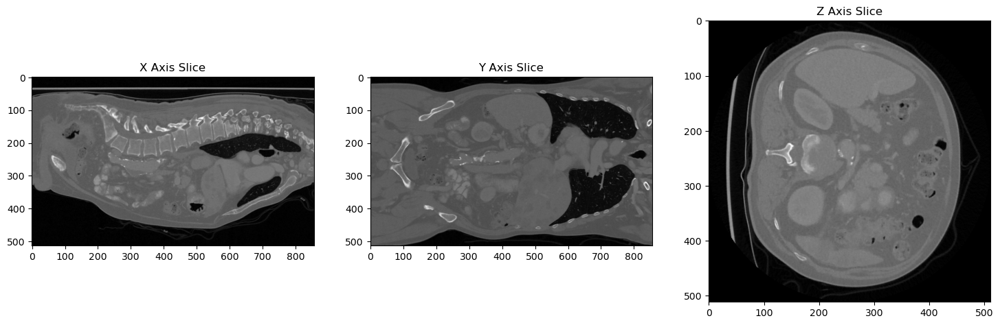

In [13]:
def view_axises(path):
  img_data = get_image_data(path)

  slices_indexes = [img_data.shape[i] // 2 for i in range(3)]

  slices_data = [
      {'title': 'X', 'image': img_data[slices_indexes[0], :, :]},
      {'title': 'Y', 'image': img_data[:, slices_indexes[1], :]},
      {'title': 'Z', 'image': img_data[:, :, slices_indexes[2]]}
  ]

  fig, axs = plt.subplots(1, 3, figsize = (18, 10))

  for i, ax_i in enumerate(axs):
    title_i = slices_data[i]['title']
    image_i = slices_data[i]['image']
    ax_i.imshow(image_i, cmap='gray')
    ax_i.title.set_text(f'{title_i} Axis Slice')

  plt.show()

view_axises(df_train.image[8])

### CT Scan - Input Image

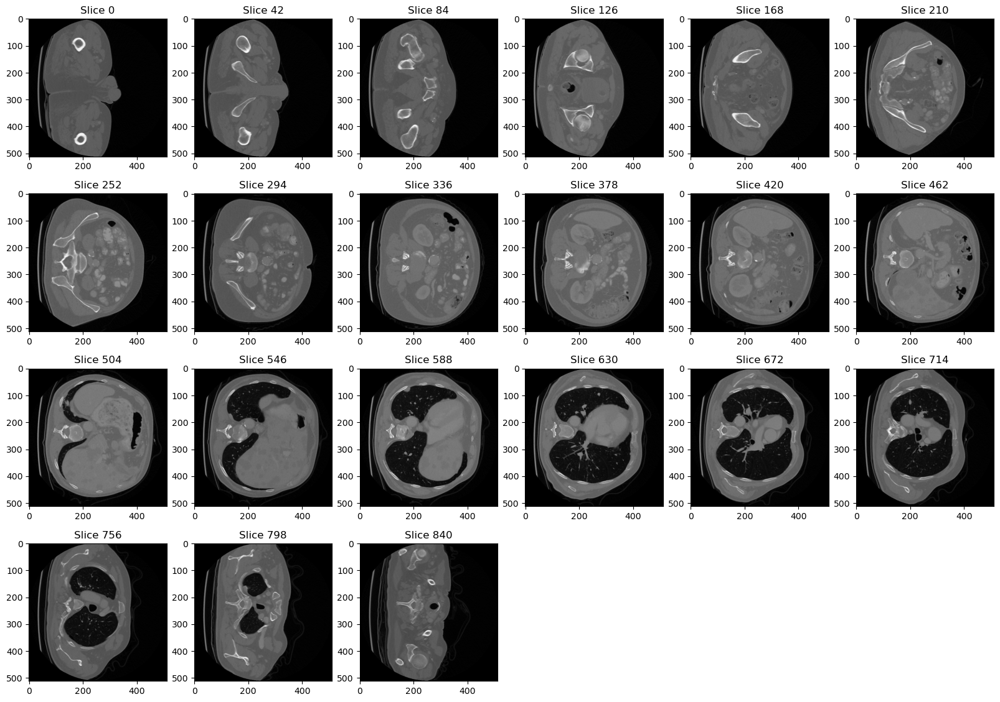

In [16]:
image_data = get_image_data(df_train.image[8])
plot_z_slices(image_data)

### Labels - Segmented Image

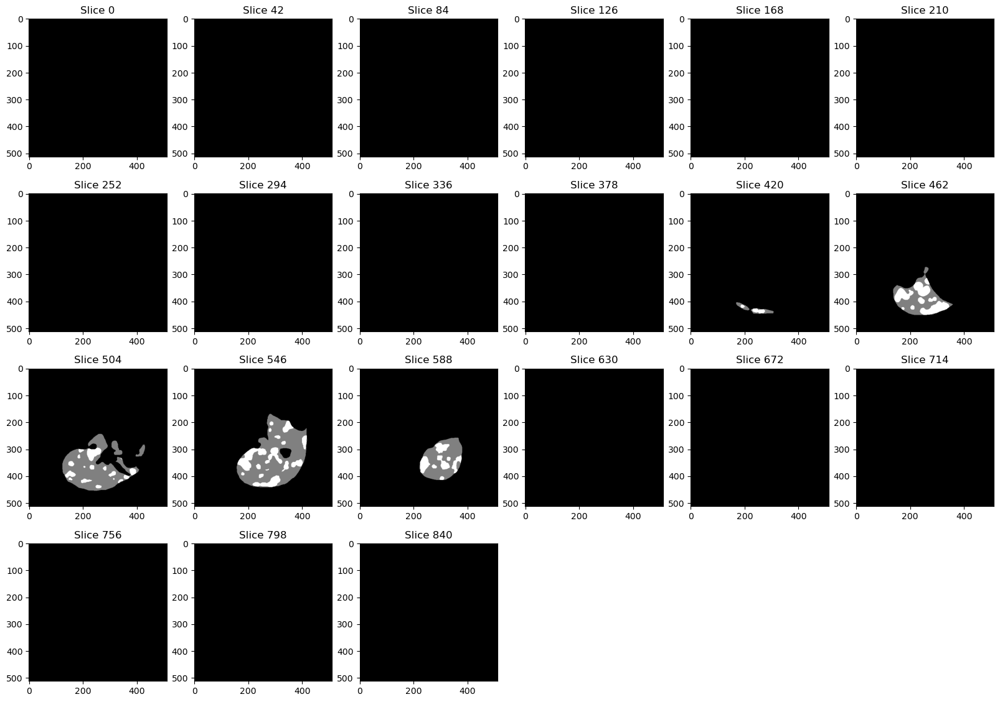

In [17]:
label_data = get_image_data(df_train.label[8])
plot_z_slices(label_data)

### Input image slice example

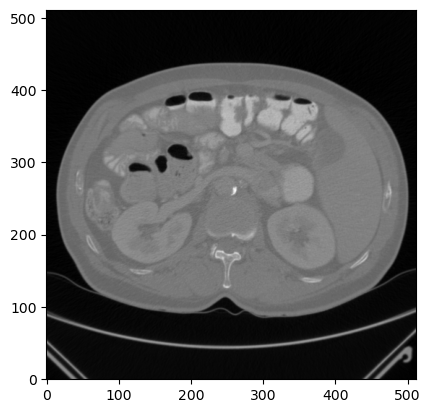

In [24]:
plot_image(df_train.image[0])

### The corresponding label slice example

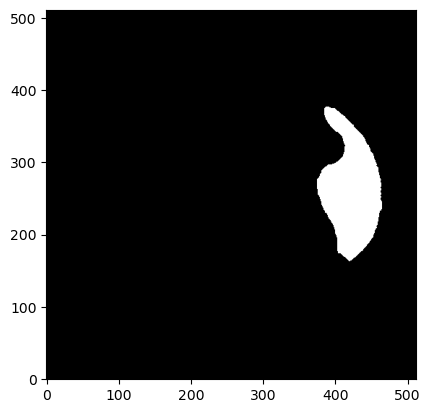

In [25]:
plot_image(df_train.label[0])

#### Visualize 3 random Slices of the same 3D image with their labels respectively

In [18]:
# Load image 8
image8 = get_image_data(df_train.image[8])
label8 = get_image_data(df_train.label[8])

print("Number of slices : {0} / Size of each slice : {1}".format(image8.shape[2], image8.shape[:2]))

Number of slices : 856 / Size of each slice : (512, 512)


Let's see how the slices look like 

We'll show 3 random slices

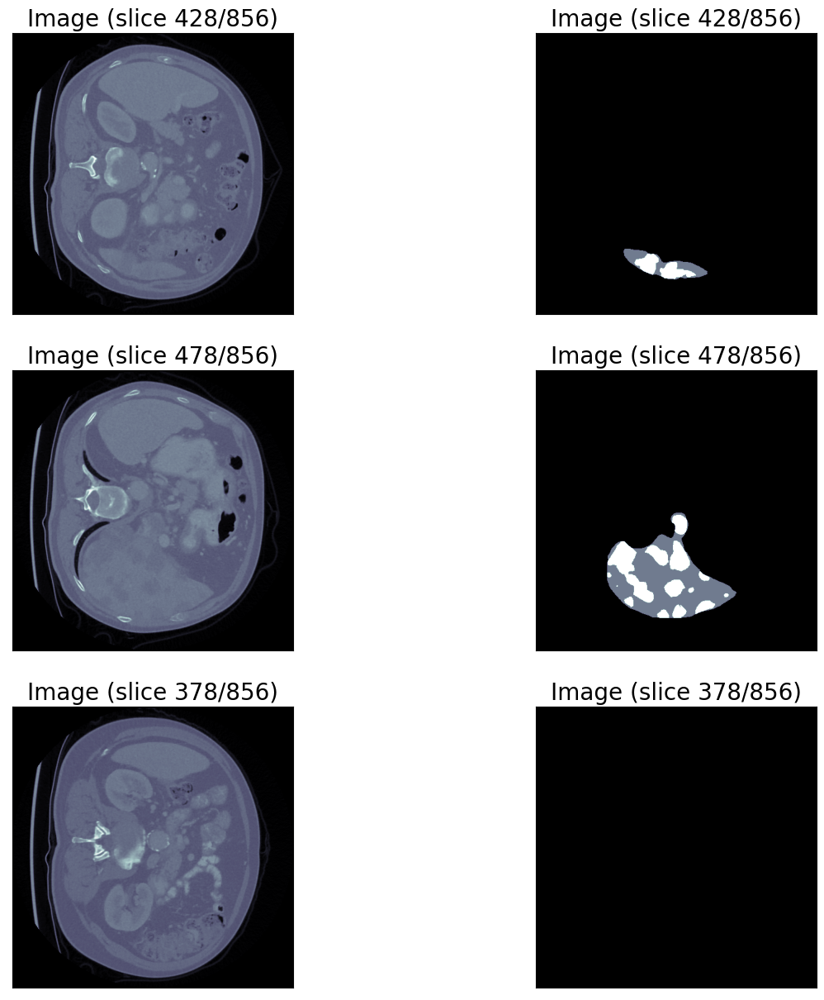

In [26]:
slice1 = image8.shape[2] // 2
slice2 = slice1 + 50
slice3 = slice1 - 50

slices = [slice1, slice2, slice3]
eff_slices = [slice1, 504, 546]

fig, axs = plt.subplots(3, 2, figsize = (15, 15))

for i, (ax1, ax2) in enumerate(axs):
  show_ax_image(ax1, image8, slices[i])
  show_ax_image(ax2, label8, slices[i])

We can see *multiple* cancerous regions in the image

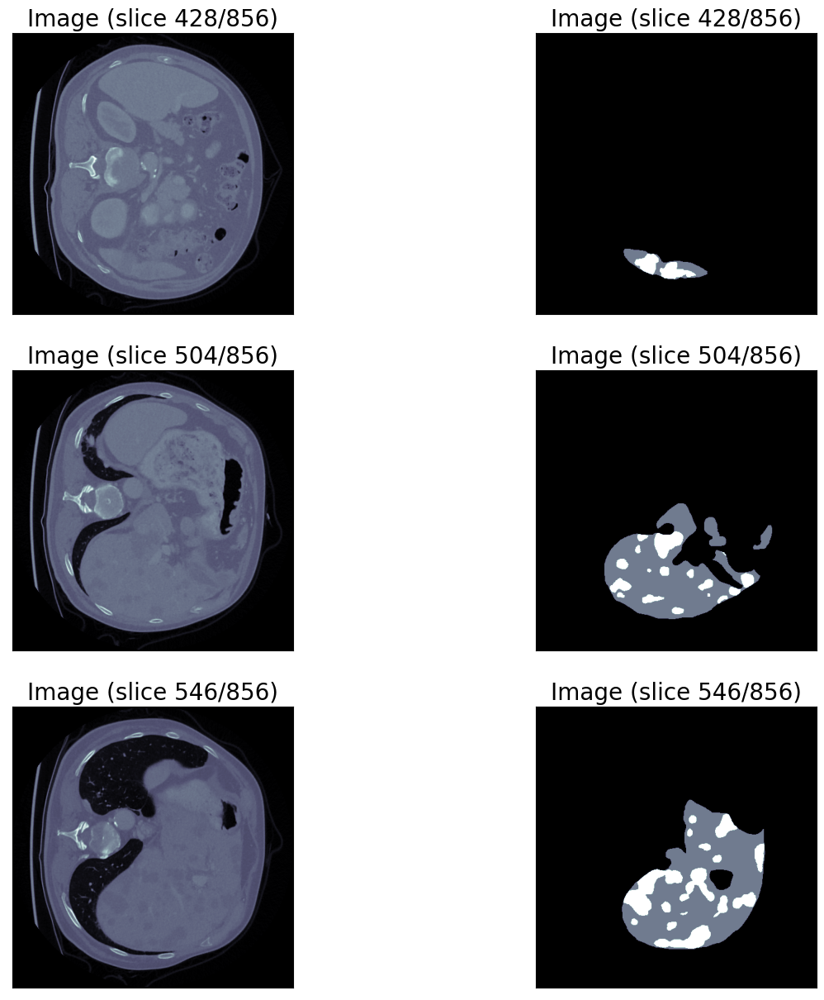

In [27]:
fig, axs = plt.subplots(3, 2, figsize = (15, 15))

for i, (ax1, ax2) in enumerate(axs):
  show_ax_image(ax1, image8, eff_slices[i])
  show_ax_image(ax2, label8, eff_slices[i])

### We show different views of the same 3D image - coronal, sagittal, axial

In [28]:
def plot_views_slice(image, slice_number):
  image_sagittal = get_sagittal_view(image)
  image_coronal = get_coronal_view(image)

  fig, ax = plt.subplots(1, 3, figsize = (60, 60))
  show_ax_image(ax[0], image8, slice_number, title="Axial View", fontsize=60)
  show_ax_image(ax[1], image_sagittal, slice_number, title="Sagittal View", fontsize=60)
  show_ax_image(ax[2], image_coronal, slice_number, title="Coronal View", fontsize=60)
  plt.show()

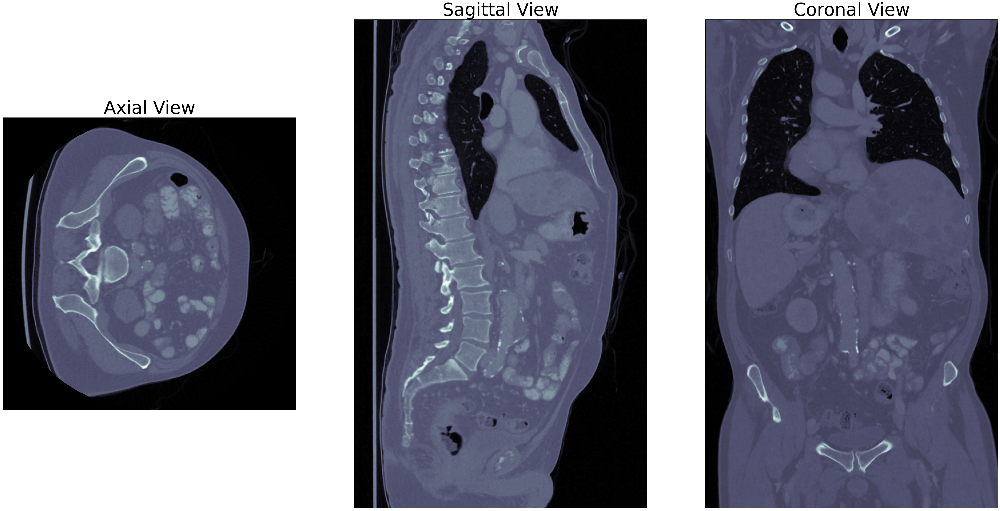

In [29]:
plot_views_slice(image8, 260)

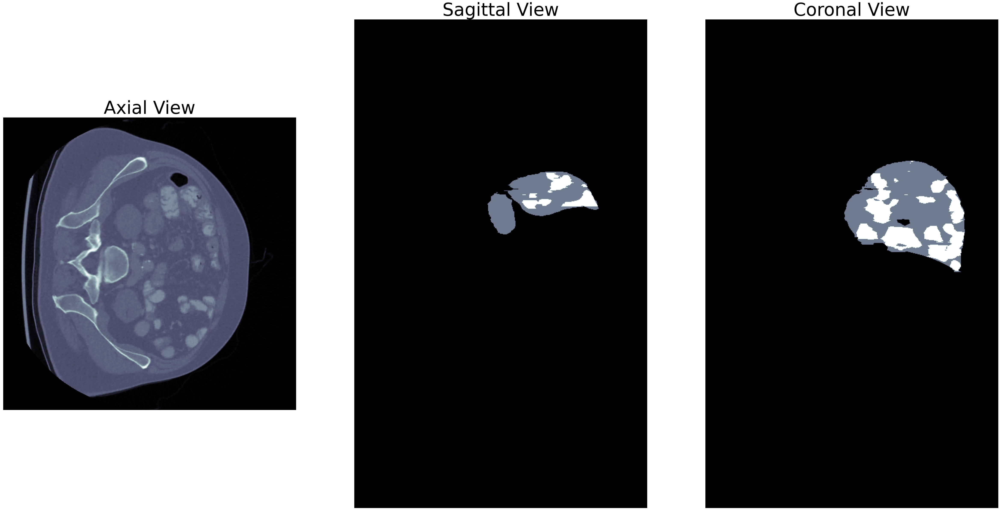

In [30]:
plot_views_slice(label8, 260)

### Labels Distribution For One Liver Segmented Image

In [31]:
def get_labels_distribution(liver_segmented, return_arrays=False):
  has_liver = []
  has_cancer = []
  not_liver = []

  for slice_num in range(liver_segmented.shape[2]):
    segmented_slice = liver_segmented[:,:, slice_num]
    _, counts = np.unique(segmented_slice, return_counts = True)

    liver_pixels = 0
    cancer_pixels = 0

    if len(counts) == 3:
      liver_pixels += counts[LABEL_LIVER]
      cancer_pixels += counts[LABEL_CANCER]
    elif len(counts) == 2:
      liver_pixels += counts[LABEL_LIVER]

    has_liver.append(1 if liver_pixels else 0)
    has_cancer.append(1 if cancer_pixels else 0)
    not_liver.append(1 if liver_pixels == 0 else 0)

  if return_arrays:
    return not_liver, has_liver, has_cancer

  # Otherwise, return the distribution counts
  return [sum(not_liver), sum(has_liver), sum(has_cancer)]

,0
No Liver,651
Liver,205
Cancer,202


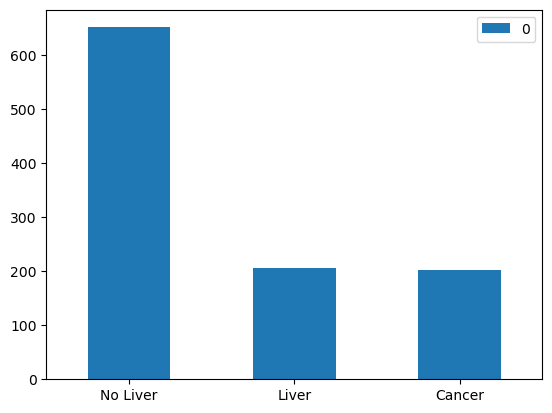

In [32]:
num_not_liver, num_has_liver, num_has_cancer = get_labels_distribution(label8)
stats = pd.DataFrame(index=['No Liver', 'Liver', 'Cancer'], data=[num_not_liver, num_has_liver, num_has_cancer])
stats.plot(kind='bar', rot=0)
stats

Text(0, 0.5, 'Class percentage (%)')

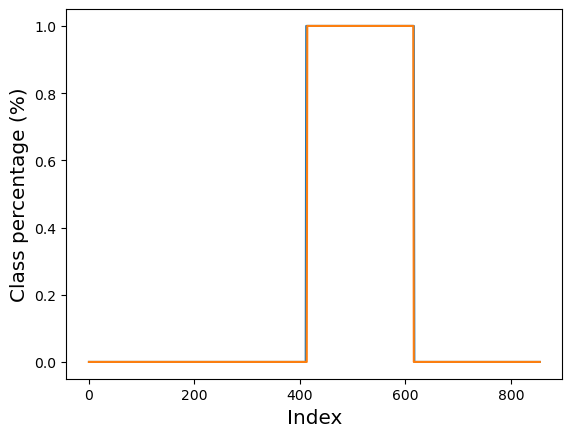

In [33]:
# visual
not_liver, has_liver, has_cancer = get_labels_distribution(label8, return_arrays=True)

plt.plot(has_liver, label="Liver")
plt.plot(has_cancer, label="Cancer")
plt.xlabel("Index", fontsize = "x-large")
plt.ylabel("Class percentage (%)", fontsize = "x-large")

Now, let's broaden our scope by studying the same process, but this time using 10 images instead of a single one.

In [34]:
# Now we do the same thing but for 10 images

total_dist = np.array([0,0,0])

for i in range(10):
  #liver_image = nib.load(f'{LIVER_DATA_PATH}/{df_train.image[15]}').get_fdata()
  liver_segmented = nib.load(f'{LIVER_DATA_PATH}/{df_train.label[i]}').get_fdata()

  dist = np.array(get_labels_distribution(liver_segmented))
  print(f"Dist for {i} --> {dist}")
  total_dist += dist


total_dist

Dist for 0 --> [449 139  16]
Dist for 1 --> [149  96  10]
Dist for 2 --> [58 36  8]
Dist for 3 --> [304 120  52]
Dist for 4 --> [656 189  44]
Dist for 5 --> [312 201  10]
Dist for 6 --> [ 77 123  18]
Dist for 7 --> [689 219 133]
Dist for 8 --> [651 205 202]
Dist for 9 --> [61 44 10]


array([3406, 1372,  503])

,0
No liver,3406
Liver,1372
Cancer,503


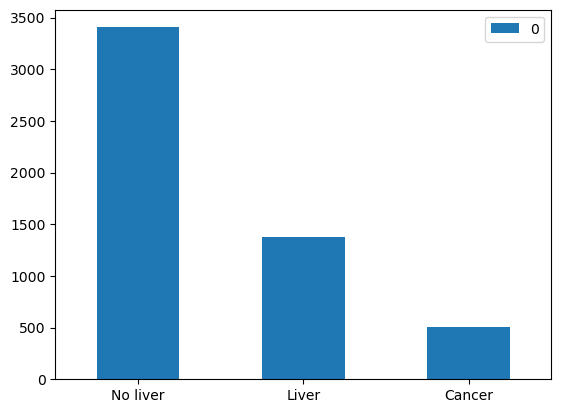

In [35]:
stats = pd.DataFrame(index=['No liver', 'Liver', 'Cancer'], data=total_dist)
stats.plot(kind='bar', rot=0)
stats

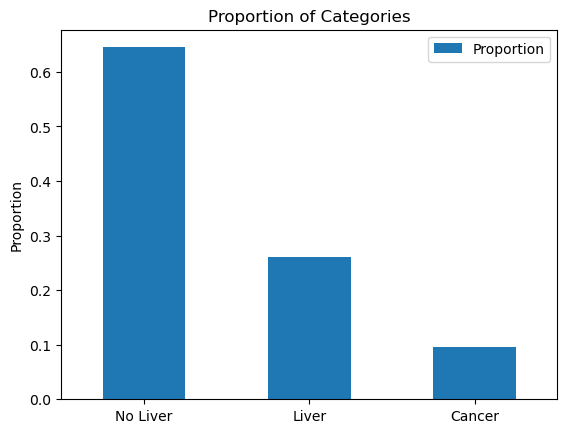

,Proportion
No Liver,0.644954
Liver,0.259799
Cancer,0.095247


In [36]:
num_of_slices = sum(total_dist)
proportions = [d/num_of_slices for d in total_dist]


stats = pd.DataFrame(index=['No Liver', 'Liver', 'Cancer'], data=proportions, columns=['Proportion'])
stats.plot(kind='bar', rot=0)
plt.ylabel('Proportion')
plt.title('Proportion of Categories')
plt.show()
stats

In [51]:
background_slices, liver_slices, cancer_slices = total_dist
print(f"Cancer slices Proportion from Liver images: {cancer_slices / liver_slices}")

Cancer slices Proportion from Liver images: 0.36661807580174927


### Intensity Distribution

In [38]:
def get_intensity_distribution(image_data):
  flattened_data = image_data.flatten()

  # Calculate the histogram
  hist, bins = np.histogram(flattened_data, bins=256)

  # Plot the histogram
  plt.plot(hist)
  plt.title('Intensity Distribution')
  plt.xlabel('Pixel Intensity')
  plt.ylabel('Frequency')
  plt.show()

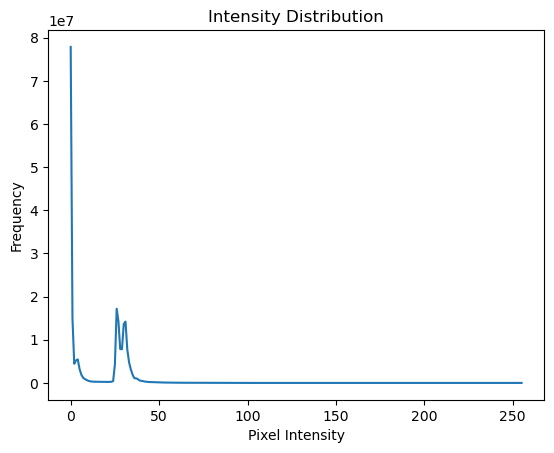

In [39]:
get_intensity_distribution(image8)

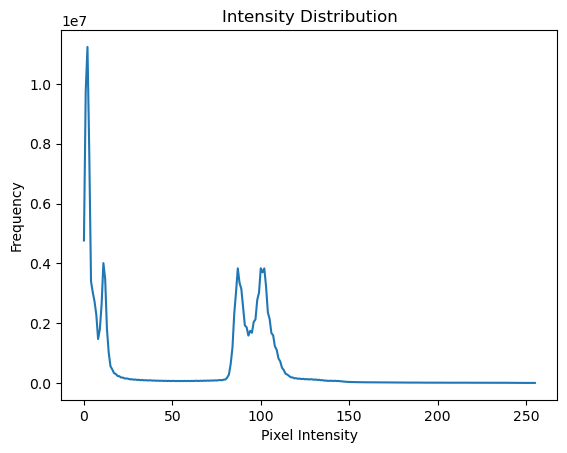

In [40]:
image20 = get_image_data(df_train.image[20])
get_intensity_distribution(image20)

### Mean Intensity over a batch of 20 images

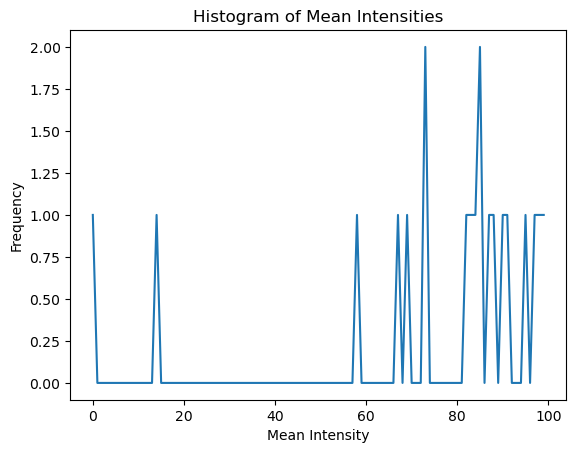

In [41]:
batch_size = 20
mean_intensities = []

for image_path in df_train.image[:20]:
    image_data = get_image_data(image_path)

    mean_intensity = np.mean(image_data)
    mean_intensities.append(mean_intensity)

hist, bins = np.histogram(mean_intensities, bins=100)

# Plot the histogram
plt.plot(hist)
plt.title('Histogram of Mean Intensities')
plt.xlabel('Mean Intensity')
plt.ylabel('Frequency')
plt.show()

### Converting cancer segmentation data to bounding boxes

In [52]:
def get_cancer_bounding_boxes(segmented_liver: np.ndarray) -> List[bbox]:
    """
    Returns a list of bounding boxes for the cancerous regions in the image.

    Args:
      segmented_liver: A 2D numpy array with the segmented liver

    Returns:
      A list of tuples with the bounding boxes of the cancer in the image, (xmin, ymin, xmax, ymax) format
    """
    cancer_mask = segmented_liver == LABEL_CANCER
    if cancer_mask.sum() == 0:
        # no cancer
        return []

    labeled_mask, num_labels = scipy_label(cancer_mask)
    bounding_boxes = []
    for i in range(1, num_labels + 1):
        mask_i = labeled_mask == i
        mask_i = torch.from_numpy(mask_i)
        box = masks_to_boxes(
            mask_i.unsqueeze(dim=0)
        )  # unsqueeze to add an extra dimension at 0th index
        bounding_boxes.append(
            (box[0][0].item(), box[0][1].item(), box[0][2].item(), box[0][3].item())
        )

    return bounding_boxes


Verify for image 8

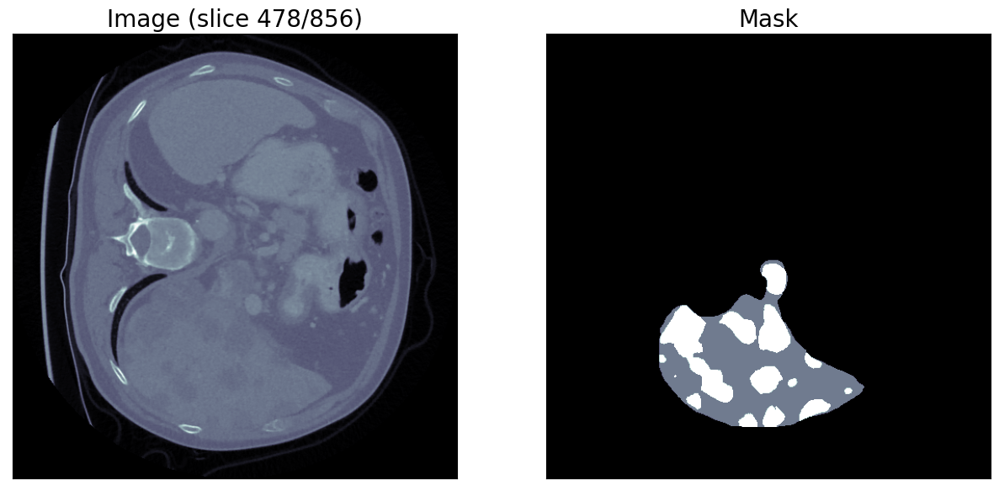

In [53]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 15))
show_ax_image(ax1, image8, slice2)
show_ax_image(ax2, label8, slice2, is_mask=True)

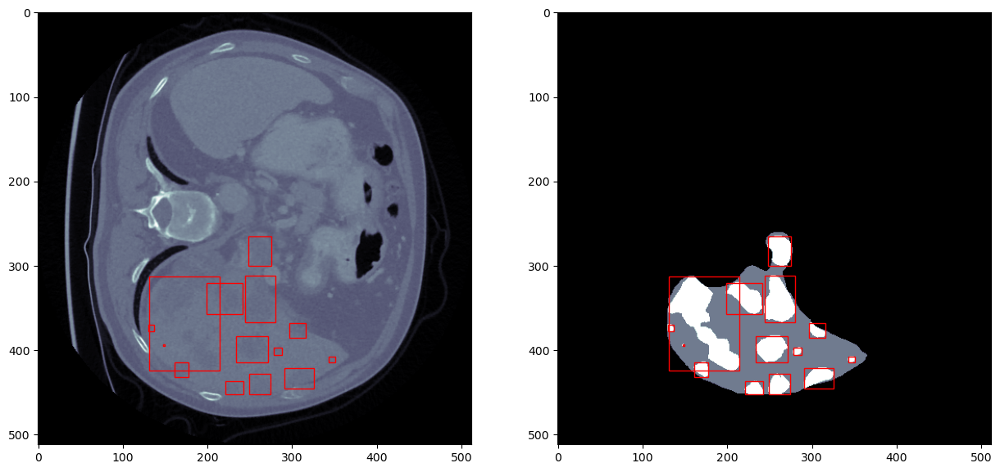

In [54]:
liver_slice8 = image8[:,:, slice2]
segmented_liver8 = label8[:,:, slice2]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 15))
bbs = get_cancer_bounding_boxes(segmented_liver8)
plot_bbs_on_slice(ax1, liver_slice8, bbs)
plot_bbs_on_slice(ax2, segmented_liver8, bbs)
plt.show()

### Data Preparation for the Task

In this section, we meticulously process and prepare our dataset, ensuring that it is optimally structured and formatted for our specific task

#### We create a JSON with the following data:
1. liver_image - The name of the liver image
2. label_image - The name of the segmented liver image
3. slice_number - The slice number 
4. has_liver - True or False
5. has_cancer - True or False
7. cancer_bbox - This represents a list of bounding boxes. Each bounding box, denoted as  (x1, y1, x2, y2), corresponds to the coordinates that encapsulate the cancerous region in the image, provided such a region exists. 


In [55]:
all_slices = []

def process_slice(i):
    liver_segmented = get_image_data(df_train.label[i])
    print(f"\tProcessing {df_train.label[i]} which has {liver_segmented.shape[2]} slices...")
    slices = []

    for slice_num in range(liver_segmented.shape[2]):
        segmented_slice = liver_segmented[:,:, slice_num]
        existing_labels = np.unique(segmented_slice)
        has_liver = LABEL_LIVER in existing_labels
        has_cancer = LABEL_CANCER in existing_labels
        cancer_bbox = get_cancer_bounding_boxes(segmented_slice)

        liver_slice = LiverSlice(liver_image=df_train.image[i],
                                 label_image=df_train.label[i],
                                 slice_number=slice_num,
                                 has_liver=has_liver,
                                 has_cancer=has_cancer,
                                 cancer_bbox=cancer_bbox)

        slices.append(liver_slice)
    
    return slices

with ThreadPoolExecutor() as executor:
    futures = [executor.submit(process_slice, i) for i in range(df_train.shape[0])]

    for future in tqdm(as_completed(futures), total=len(futures)):
        liver_slices = future.result()
        all_slices += liver_slices

  0%|                                                                                                                                                         | 0/131 [00:00<?, ?it/s]

	Processing ./labelsTr/liver_77.nii.gz which has 94 slices...
	Processing ./labelsTr/liver_53.nii.gz which has 105 slices...
	Processing ./labelsTr/liver_30.nii.gz which has 200 slices...
	Processing ./labelsTr/liver_69.nii.gz which has 245 slices...
	Processing ./labelsTr/liver_120.nii.gz which has 424 slices...
	Processing ./labelsTr/liver_65.nii.gz which has 513 slices...
	Processing ./labelsTr/liver_14.nii.gz which has 588 slices...


  1%|█                                                                                                                                                | 1/131 [00:01<04:15,  1.97s/it]

	Processing ./labelsTr/liver_18.nii.gz which has 845 slices...


  2%|██▏                                                                                                                                              | 2/131 [00:02<02:26,  1.14s/it]

	Processing ./labelsTr/liver_116.nii.gz which has 908 slices...
	Processing ./labelsTr/liver_108.nii.gz which has 856 slices...
	Processing ./labelsTr/liver_22.nii.gz which has 247 slices...


  2%|███▎                                                                                                                                             | 3/131 [00:04<02:52,  1.35s/it]

	Processing ./labelsTr/liver_104.nii.gz which has 781 slices...
	Processing ./labelsTr/liver_41.nii.gz which has 113 slices...


  5%|██████▋                                                                                                                                          | 6/131 [00:06<01:44,  1.19it/s]

	Processing ./labelsTr/liver_96.nii.gz which has 722 slices...
	Processing ./labelsTr/liver_88.nii.gz which has 811 slices...


  5%|███████▋                                                                                                                                         | 7/131 [00:08<02:26,  1.18s/it]

	Processing ./labelsTr/liver_84.nii.gz which has 733 slices...
	Processing ./labelsTr/liver_1.nii.gz which has 123 slices...


  8%|██████████▉                                                                                                                                     | 10/131 [00:10<01:50,  1.10it/s]

	Processing ./labelsTr/liver_98.nii.gz which has 645 slices...
	Processing ./labelsTr/liver_86.nii.gz which has 647 slices...
	Processing ./labelsTr/liver_94.nii.gz which has 917 slices...


  8%|████████████                                                                                                                                    | 11/131 [00:15<03:50,  1.92s/it]

	Processing ./labelsTr/liver_3.nii.gz which has 534 slices...


 10%|██████████████▎                                                                                                                                 | 13/131 [00:18<03:15,  1.66s/it]

	Processing ./labelsTr/liver_67.nii.gz which has 165 slices...
	Processing ./labelsTr/liver_122.nii.gz which has 422 slices...


 11%|███████████████▍                                                                                                                                | 14/131 [00:20<03:31,  1.81s/it]

	Processing ./labelsTr/liver_79.nii.gz which has 147 slices...


 12%|█████████████████▌                                                                                                                              | 16/131 [00:21<02:15,  1.18s/it]

	Processing ./labelsTr/liver_75.nii.gz which has 89 slices...


 15%|████████████████████▉                                                                                                                           | 19/131 [00:23<01:26,  1.29it/s]

	Processing ./labelsTr/liver_16.nii.gz which has 689 slices...
	Processing ./labelsTr/liver_130.nii.gz which has 624 slices...


 15%|█████████████████████▉                                                                                                                          | 20/131 [00:24<01:21,  1.37it/s]

	Processing ./labelsTr/liver_43.nii.gz which has 155 slices...
	Processing ./labelsTr/liver_118.nii.gz which has 427 slices...


 16%|███████████████████████                                                                                                                         | 21/131 [00:25<01:40,  1.10it/s]

	Processing ./labelsTr/liver_106.nii.gz which has 771 slices...


 18%|█████████████████████████▎                                                                                                                      | 23/131 [00:26<01:18,  1.38it/s]

	Processing ./labelsTr/liver_51.nii.gz which has 227 slices...
	Processing ./labelsTr/liver_20.nii.gz which has 574 slices...


 18%|██████████████████████████▍                                                                                                                     | 24/131 [00:27<01:14,  1.43it/s]

	Processing ./labelsTr/liver_32.nii.gz which has 139 slices...
	Processing ./labelsTr/liver_114.nii.gz which has 846 slices...


 21%|█████████████████████████████▋                                                                                                                  | 27/131 [00:29<01:16,  1.36it/s]

	Processing ./labelsTr/liver_7.nii.gz which has 541 slices...


 21%|██████████████████████████████▊                                                                                                                 | 28/131 [00:31<01:28,  1.17it/s]

	Processing ./labelsTr/liver_90.nii.gz which has 751 slices...
	Processing ./labelsTr/liver_82.nii.gz which has 519 slices...
	Processing ./labelsTr/liver_55.nii.gz which has 192 slices...


 22%|███████████████████████████████▉                                                                                                                | 29/131 [00:32<01:56,  1.14s/it]

	Processing ./labelsTr/liver_28.nii.gz which has 129 slices...


 23%|████████████████████████████████▉                                                                                                               | 30/131 [00:34<01:57,  1.16s/it]

	Processing ./labelsTr/liver_110.nii.gz which has 816 slices...


 24%|███████████████████████████████████▏                                                                                                            | 32/131 [00:36<01:50,  1.11s/it]

	Processing ./labelsTr/liver_36.nii.gz which has 111 slices...


 25%|████████████████████████████████████▎                                                                                                           | 33/131 [00:36<01:30,  1.09it/s]

	Processing ./labelsTr/liver_47.nii.gz which has 225 slices...
	Processing ./labelsTr/liver_59.nii.gz which has 216 slices...


 27%|███████████████████████████████████████▌                                                                                                        | 36/131 [00:38<01:03,  1.50it/s]

	Processing ./labelsTr/liver_71.nii.gz which has 94 slices...
	Processing ./labelsTr/liver_24.nii.gz which has 276 slices...


 28%|████████████████████████████████████████▋                                                                                                       | 37/131 [00:39<01:04,  1.45it/s]

	Processing ./labelsTr/liver_102.nii.gz which has 677 slices...


 30%|██████████████████████████████████████████▊                                                                                                     | 39/131 [00:40<00:47,  1.95it/s]

	Processing ./labelsTr/liver_63.nii.gz which has 104 slices...


 31%|█████████████████████████████████████████████                                                                                                   | 41/131 [00:40<00:33,  2.69it/s]

	Processing ./labelsTr/liver_12.nii.gz which has 455 slices...


 32%|██████████████████████████████████████████████▏                                                                                                 | 42/131 [00:41<00:34,  2.60it/s]

	Processing ./labelsTr/liver_126.nii.gz which has 401 slices...
	Processing ./labelsTr/liver_45.nii.gz which has 74 slices...


 33%|███████████████████████████████████████████████▎                                                                                                | 43/131 [00:42<00:54,  1.61it/s]

	Processing ./labelsTr/liver_26.nii.gz which has 668 slices...


 34%|████████████████████████████████████████████████▎                                                                                               | 44/131 [00:42<00:51,  1.68it/s]

	Processing ./labelsTr/liver_100.nii.gz which has 685 slices...
	Processing ./labelsTr/liver_38.nii.gz which has 132 slices...


 34%|█████████████████████████████████████████████████▍                                                                                              | 45/131 [00:43<00:47,  1.81it/s]

	Processing ./labelsTr/liver_49.nii.gz which has 254 slices...
	Processing ./labelsTr/liver_34.nii.gz which has 151 slices...


 37%|████████████████████████████████████████████████████▊                                                                                           | 48/131 [00:46<00:59,  1.40it/s]

	Processing ./labelsTr/liver_112.nii.gz which has 751 slices...
	Processing ./labelsTr/liver_57.nii.gz which has 366 slices...
	Processing ./labelsTr/liver_124.nii.gz which has 407 slices...


 38%|██████████████████████████████████████████████████████▉                                                                                         | 50/131 [00:47<00:54,  1.48it/s]

	Processing ./labelsTr/liver_61.nii.gz which has 193 slices...


 39%|████████████████████████████████████████████████████████                                                                                        | 51/131 [00:48<00:55,  1.43it/s]

	Processing ./labelsTr/liver_73.nii.gz which has 121 slices...
	Processing ./labelsTr/liver_10.nii.gz which has 501 slices...


 42%|████████████████████████████████████████████████████████████▍                                                                                   | 55/131 [00:50<00:42,  1.77it/s]

	Processing ./labelsTr/liver_80.nii.gz which has 217 slices...
	Processing ./labelsTr/liver_9.nii.gz which has 549 slices...
	Processing ./labelsTr/liver_5.nii.gz which has 537 slices...
	Processing ./labelsTr/liver_128.nii.gz which has 654 slices...


 44%|███████████████████████████████████████████████████████████████▊                                                                                | 58/131 [00:54<01:00,  1.21it/s]

	Processing ./labelsTr/liver_0.nii.gz which has 75 slices...
	Processing ./labelsTr/liver_92.nii.gz which has 836 slices...


 46%|█████████████████████████████████████████████████████████████████▉                                                                              | 60/131 [00:55<00:56,  1.26it/s]

	Processing ./labelsTr/liver_89.nii.gz which has 766 slices...
	Processing ./labelsTr/liver_97.nii.gz which has 671 slices...
	Processing ./labelsTr/liver_85.nii.gz which has 630 slices...


 48%|█████████████████████████████████████████████████████████████████████▎                                                                          | 63/131 [00:58<00:49,  1.39it/s]

	Processing ./labelsTr/liver_52.nii.gz which has 237 slices...
	Processing ./labelsTr/liver_31.nii.gz which has 91 slices...
	Processing ./labelsTr/liver_109.nii.gz which has 756 slices...


 50%|███████████████████████████████████████████████████████████████████████▍                                                                        | 65/131 [01:00<00:54,  1.21it/s]

	Processing ./labelsTr/liver_40.nii.gz which has 122 slices...


 51%|█████████████████████████████████████████████████████████████████████████▋                                                                      | 67/131 [01:02<00:50,  1.26it/s]

	Processing ./labelsTr/liver_117.nii.gz which has 836 slices...
	Processing ./labelsTr/liver_23.nii.gz which has 391 slices...
	Processing ./labelsTr/liver_105.nii.gz which has 986 slices...


 52%|██████████████████████████████████████████████████████████████████████████▋                                                                     | 68/131 [01:04<01:24,  1.34s/it]

	Processing ./labelsTr/liver_76.nii.gz which has 168 slices...


 53%|███████████████████████████████████████████████████████████████████████████▊                                                                    | 69/131 [01:05<01:20,  1.30s/it]

	Processing ./labelsTr/liver_68.nii.gz which has 266 slices...


 55%|███████████████████████████████████████████████████████████████████████████████▏                                                                | 72/131 [01:07<00:41,  1.41it/s]

	Processing ./labelsTr/liver_64.nii.gz which has 230 slices...
	Processing ./labelsTr/liver_15.nii.gz which has 565 slices...


 56%|█████████████████████████████████████████████████████████████████████████████████▎                                                              | 74/131 [01:08<00:41,  1.39it/s]

	Processing ./labelsTr/liver_19.nii.gz which has 547 slices...
	Processing ./labelsTr/liver_121.nii.gz which has 463 slices...


 57%|██████████████████████████████████████████████████████████████████████████████████▍                                                             | 75/131 [01:10<00:56,  1.02s/it]

	Processing ./labelsTr/liver_107.nii.gz which has 771 slices...


 58%|███████████████████████████████████████████████████████████████████████████████████▌                                                            | 76/131 [01:11<01:00,  1.10s/it]

	Processing ./labelsTr/liver_21.nii.gz which has 437 slices...
	Processing ./labelsTr/liver_42.nii.gz which has 125 slices...


 60%|██████████████████████████████████████████████████████████████████████████████████████▊                                                         | 79/131 [01:14<00:40,  1.30it/s]

	Processing ./labelsTr/liver_119.nii.gz which has 461 slices...
	Processing ./labelsTr/liver_33.nii.gz which has 135 slices...
	Processing ./labelsTr/liver_115.nii.gz which has 846 slices...


 62%|█████████████████████████████████████████████████████████████████████████████████████████                                                       | 81/131 [01:16<00:45,  1.09it/s]

	Processing ./labelsTr/liver_78.nii.gz which has 198 slices...
	Processing ./labelsTr/liver_50.nii.gz which has 240 slices...


 63%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 83/131 [01:18<00:44,  1.09it/s]

	Processing ./labelsTr/liver_123.nii.gz which has 432 slices...
	Processing ./labelsTr/liver_66.nii.gz which has 86 slices...


 65%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 85/131 [01:19<00:31,  1.47it/s]

	Processing ./labelsTr/liver_74.nii.gz which has 107 slices...


 68%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 89/131 [01:21<00:18,  2.31it/s]

	Processing ./labelsTr/liver_17.nii.gz which has 826 slices...
	Processing ./labelsTr/liver_2.nii.gz which has 517 slices...


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 90/131 [01:22<00:21,  1.93it/s]

	Processing ./labelsTr/liver_99.nii.gz which has 629 slices...
	Processing ./labelsTr/liver_87.nii.gz which has 896 slices...
	Processing ./labelsTr/liver_95.nii.gz which has 841 slices...


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 91/131 [01:23<00:33,  1.21it/s]

	Processing ./labelsTr/liver_13.nii.gz which has 605 slices...
	Processing ./labelsTr/liver_70.nii.gz which has 333 slices...


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 93/131 [01:27<00:53,  1.41s/it]

	Processing ./labelsTr/liver_127.nii.gz which has 987 slices...
	Processing ./labelsTr/liver_62.nii.gz which has 188 slices...


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 96/131 [01:30<00:33,  1.03it/s]

	Processing ./labelsTr/liver_37.nii.gz which has 122 slices...
	Processing ./labelsTr/liver_29.nii.gz which has 172 slices...
	Processing ./labelsTr/liver_111.nii.gz which has 761 slices...


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 97/131 [01:30<00:30,  1.11it/s]

	Processing ./labelsTr/liver_54.nii.gz which has 96 slices...


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 102/131 [01:34<00:16,  1.77it/s]

	Processing ./labelsTr/liver_103.nii.gz which has 683 slices...
	Processing ./labelsTr/liver_25.nii.gz which has 601 slices...
	Processing ./labelsTr/liver_58.nii.gz which has 212 slices...
	Processing ./labelsTr/liver_46.nii.gz which has 124 slices...


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 104/131 [01:36<00:21,  1.25it/s]

	Processing ./labelsTr/liver_91.nii.gz which has 751 slices...
	Processing ./labelsTr/liver_83.nii.gz which has 871 slices...
	Processing ./labelsTr/liver_81.nii.gz which has 343 slices...


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 106/131 [01:37<00:18,  1.32it/s]

	Processing ./labelsTr/liver_6.nii.gz which has 518 slices...


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 107/131 [01:37<00:14,  1.62it/s]

	Processing ./labelsTr/liver_8.nii.gz which has 541 slices...
	Processing ./labelsTr/liver_93.nii.gz which has 696 slices...


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 109/131 [01:42<00:27,  1.26s/it]

	Processing ./labelsTr/liver_60.nii.gz which has 244 slices...


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 111/131 [01:43<00:17,  1.12it/s]

	Processing ./labelsTr/liver_4.nii.gz which has 841 slices...
	Processing ./labelsTr/liver_125.nii.gz which has 410 slices...
	Processing ./labelsTr/liver_129.nii.gz which has 338 slices...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 112/131 [01:45<00:20,  1.09s/it]

	Processing ./labelsTr/liver_72.nii.gz which has 93 slices...


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 114/131 [01:46<00:16,  1.06it/s]

	Processing ./labelsTr/liver_44.nii.gz which has 119 slices...
	Processing ./labelsTr/liver_39.nii.gz which has 260 slices...


 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 117/131 [01:48<00:08,  1.59it/s]

	Processing ./labelsTr/liver_11.nii.gz which has 466 slices...
	Processing ./labelsTr/liver_27.nii.gz which has 861 slices...


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 118/131 [01:49<00:11,  1.15it/s]

	Processing ./labelsTr/liver_101.nii.gz which has 683 slices...


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 119/131 [01:50<00:09,  1.27it/s]

	Processing ./labelsTr/liver_56.nii.gz which has 239 slices...
	Processing ./labelsTr/liver_35.nii.gz which has 124 slices...
	Processing ./labelsTr/liver_113.nii.gz which has 836 slices...


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 121/131 [01:53<00:10,  1.01s/it]

	Processing ./labelsTr/liver_48.nii.gz which has 244 slices...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 131/131 [01:58<00:00,  1.10it/s]


In [56]:
print("Total slices:", len(all_slices))
all_slices[:5], [slice for slice in all_slices if slice.has_cancer][:5]

Total slices: 58638


([LiverSlice(liver_image='./imagesTr/liver_77.nii.gz', label_image='./labelsTr/liver_77.nii.gz', slice_number=0, has_liver=False, has_cancer=False, cancer_bbox=[]),
  LiverSlice(liver_image='./imagesTr/liver_77.nii.gz', label_image='./labelsTr/liver_77.nii.gz', slice_number=1, has_liver=False, has_cancer=False, cancer_bbox=[]),
  LiverSlice(liver_image='./imagesTr/liver_77.nii.gz', label_image='./labelsTr/liver_77.nii.gz', slice_number=2, has_liver=False, has_cancer=False, cancer_bbox=[]),
  LiverSlice(liver_image='./imagesTr/liver_77.nii.gz', label_image='./labelsTr/liver_77.nii.gz', slice_number=3, has_liver=False, has_cancer=False, cancer_bbox=[]),
  LiverSlice(liver_image='./imagesTr/liver_77.nii.gz', label_image='./labelsTr/liver_77.nii.gz', slice_number=4, has_liver=False, has_cancer=False, cancer_bbox=[])],
 [LiverSlice(liver_image='./imagesTr/liver_77.nii.gz', label_image='./labelsTr/liver_77.nii.gz', slice_number=74, has_liver=True, has_cancer=True, cancer_bbox=[(320.0, 355.0,

In [14]:
res = [asdict(s) for s in all_slices]
with open("slices_data.json", "w") as f:
  json.dump(res, f)

For model training and evaluation, we will load the data from the JSON file and use it to create a custom PyTorch dataset.
